# Task

### Pre-defined Code

In [1]:
# Importing all the required libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt
from matplotlib import style
from glob import glob
from natsort import natsorted
from tqdm import tqdm
style.use('ggplot')

In [2]:
def show_image_grid(images, M, N, title='Title', figsize=8):
    # Assuming 'images' is a numpy array of shape (num_images, height, width, channels)
    if M==1:
        row_size = figsize
        col_size = figsize//4
    elif N==1:
        row_size = figsize//4
        col_size = figsize
    else:
        row_size, col_size = figsize, figsize

    fig, axes = plt.subplots(M, N, figsize=(row_size, col_size))

    if len(images.shape) < 4:
        images = np.expand_dims(images.copy(), axis=0)

    fig.suptitle(title)
    for i in range(M):
        for j in range(N):
            if M==1 and N==1:
                ax = axes
            elif M == 1 or N==1:
                ax = axes[max(i, j)]
            else:
                ax = axes[i, j]
            index = i * N + j
            if index < images.shape[0]:
                ax.imshow(cv2.cvtColor(images[index], cv2.COLOR_BGR2RGB))
            ax.axis('off')
    plt.tight_layout()
    plt.show()

100%|██████████| 5/5 [00:00<00:00, 67.95it/s]


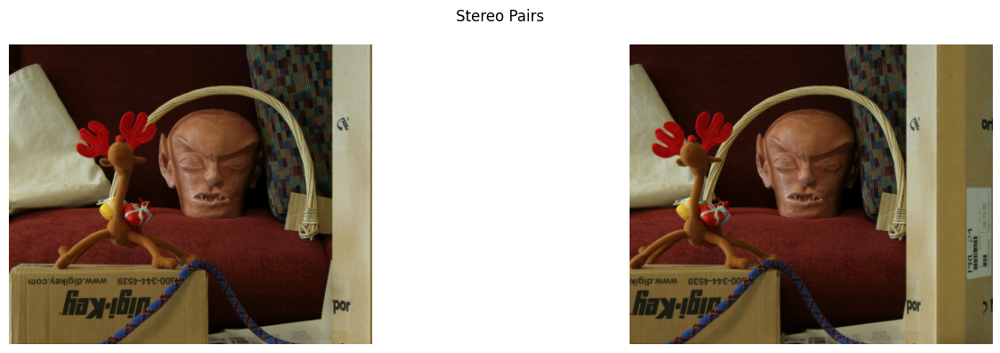

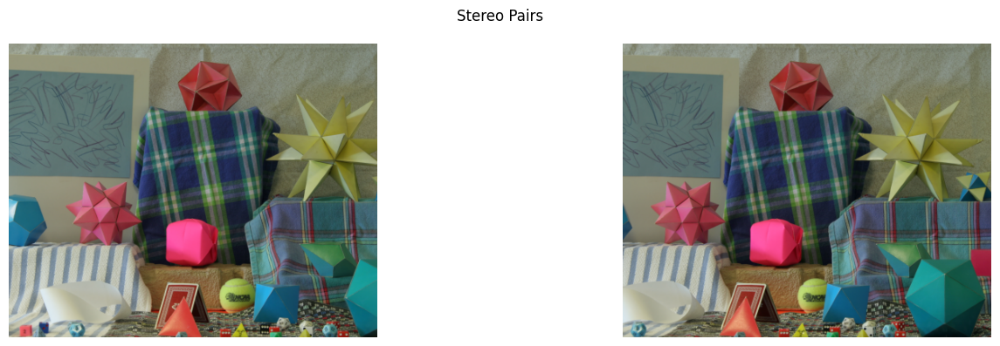

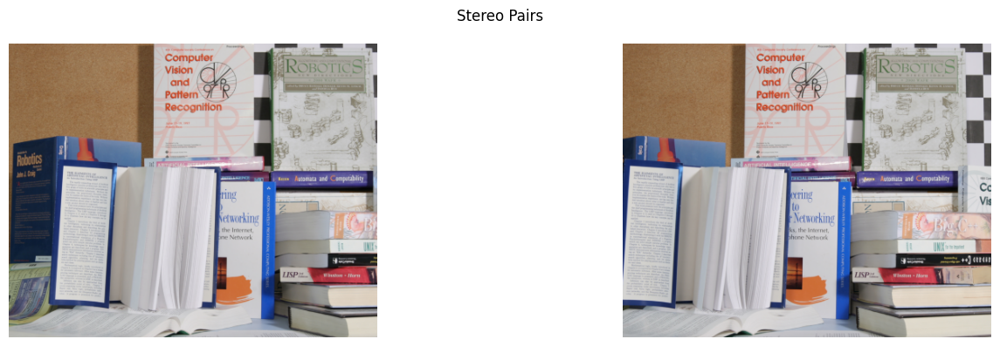

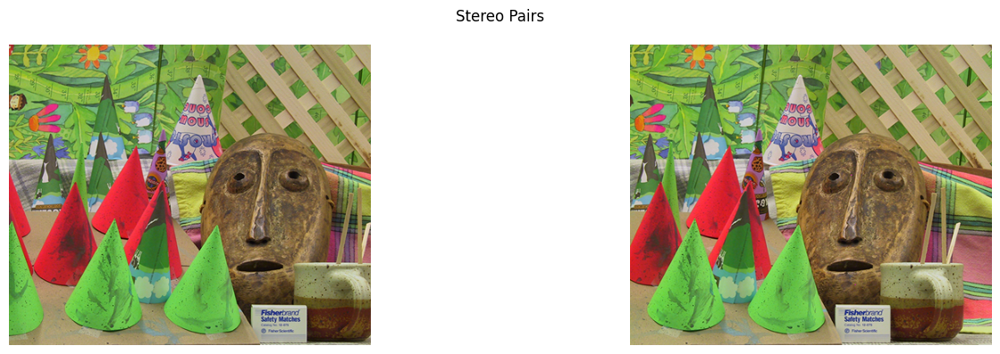

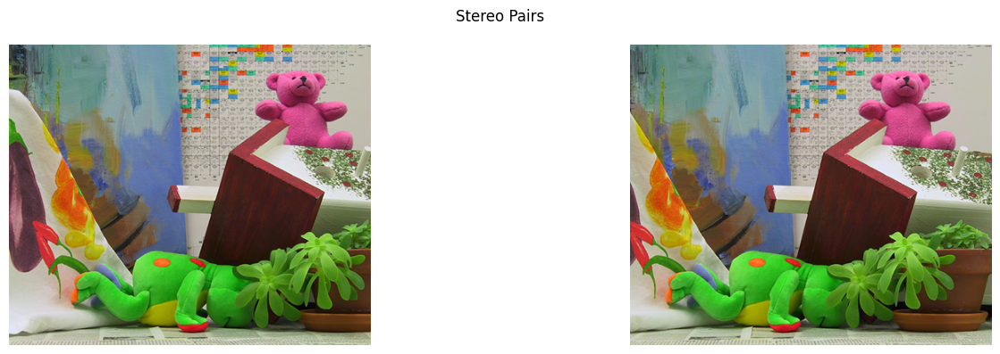

In [3]:
# Loading all the images from the folder
image_folder = '../../data/images/E'
pair_images = []

paths = natsorted(glob(f'{image_folder}/*'))

for idx in tqdm(range(0, len(paths), 2)):
    pair_images.append(np.array([cv2.imread(paths[idx], 1), cv2.imread(paths[idx+1], 1)]))

for pairs in pair_images:
    show_image_grid(pairs, 1, 2, 'Stereo Pairs', figsize=16)


### Reconstruction Algorithm

1. [Reconstruction](https://www.cs.cmu.edu/~16385/s15/lectures/Lecture19.pdf) [Must Read]

2. [Stereo and Disparity](https://johnwlambert.github.io/stereo/)

3. [Stereo and 3D Vision](https://courses.cs.washington.edu/courses/cse455/09wi/Lects/lect16.pdf)

4. [Stereo Reconstruction](https://cs.nyu.edu/~fergus/teaching/vision/9_10_Stereo.pdf)

5. [Epipolar Geometry and the Fundamental Matrix](https://www.robots.ox.ac.uk/~vgg/hzbook/hzbook1/HZepipolar.pdf)

### Q1: Matching Points [2 Marks]

Find the matching points between image pair. You can use OpenCV SIFT feature matching. Plot the matching points over the image.

In [ ]:
def detect_and_compute_keypoints(image):
    """Detects keypoints and computes descriptors using SIFT."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    sift = cv2.SIFT_create()
    keypoints, descriptors = sift.detectAndCompute(gray, None)
    return keypoints, descriptors

def match_descriptors(descriptors_a, descriptors_b):
    """Matches descriptors using FLANN or falls back to BFMatcher if needed."""
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
    search_params = dict(checks=50)

    try:
        flann = cv2.FlannBasedMatcher(index_params, search_params)
        matches = flann.knnMatch(descriptors_a, descriptors_b, k=2)
    except cv2.error:
        bf = cv2.BFMatcher()
        matches = bf.knnMatch(descriptors_a, descriptors_b, k=2)

    return matches

def filter_good_matches(matches, ratio_threshold=0.7, max_features=100):
    """Filters matches using Lowe's ratio test and selects the best matches."""
    good_matches = []
    for m, n in matches:
        if m.distance / n.distance < ratio_threshold:
            good_matches.append(m)
    return sorted(good_matches, key=lambda x: x.distance)[:max_features]

def extract_matched_points(keypoints_a, keypoints_b, matches):
    """Extracts matched points from keypoints based on the matches."""
    points_a = np.float32([keypoints_a[m.queryIdx].pt for m in matches])
    points_b = np.float32([keypoints_b[m.trainIdx].pt for m in matches])
    return points_a, points_b

In [ ]:
def visualize_matches(image_a, image_b, points_a, points_b, border_width = 5):
    """Visualizes matching points between two images."""
    combined_width = image_a.shape[1] + image_b.shape[1]
    combined_width = image_a.shape[1] + image_b.shape[1] + border_width
    combined_height = max(image_a.shape[0], image_b.shape[0])

    combined_image = np.zeros((combined_height, combined_width, 3), dtype=np.uint8)

    combined_image[:image_a.shape[0], :image_a.shape[1]] = image_a
    combined_image[:image_b.shape[0], image_a.shape[1] + border_width:] = image_b
    combined_image[:, image_a.shape[1]:image_a.shape[1] + border_width] = 255

    plt.figure(figsize=(15, 5))
    plt.imshow(cv2.cvtColor(combined_image, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    for (x1, y1), (x2, y2) in zip(points_a, points_b):
        x2_adjusted = x2 + image_a.shape[1] + border_width
        plt.scatter(x1, y1, edgecolors='red', facecolors='none', s=50, linewidths=1)
        plt.scatter(x2_adjusted, y2, edgecolors='red', facecolors='none', s=50, linewidths=1)
        plt.plot([x1, x2_adjusted], [y1, y2], 'g-', alpha=0.5, linewidth=1)

    plt.title(f"Feature Matches: {len(points_a)} points")
    plt.show()

In [ ]:
def build_matching_point_pairs(image_a, image_b, visualize=True, max_features=100):
    """Builds matching point pairs between two images."""
    keypoints_a, descriptors_a = detect_and_compute_keypoints(image_a)
    keypoints_b, descriptors_b = detect_and_compute_keypoints(image_b)

    if descriptors_a is None or descriptors_b is None:
        print("No features detected in one or both images.")
        return [], []

    matches = match_descriptors(descriptors_a, descriptors_b)
    good_matches = filter_good_matches(matches, max_features=max_features)
    points_a, points_b = extract_matched_points(keypoints_a, keypoints_b, good_matches)

    if visualize and len(points_a) > 0:
        visualize_matches(image_a, image_b, points_a, points_b)

    return points_a, points_b

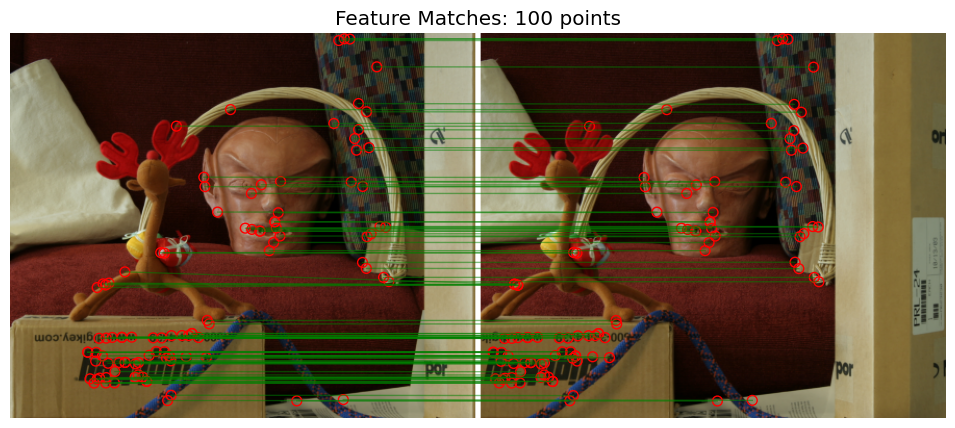

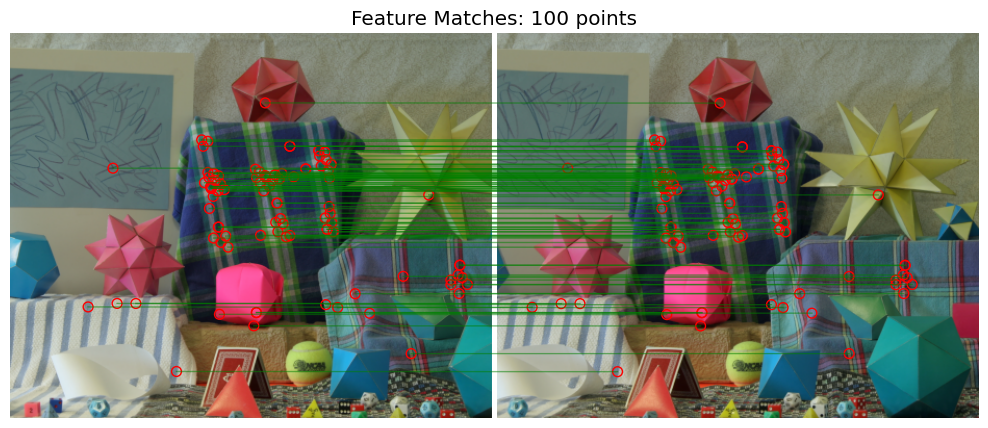

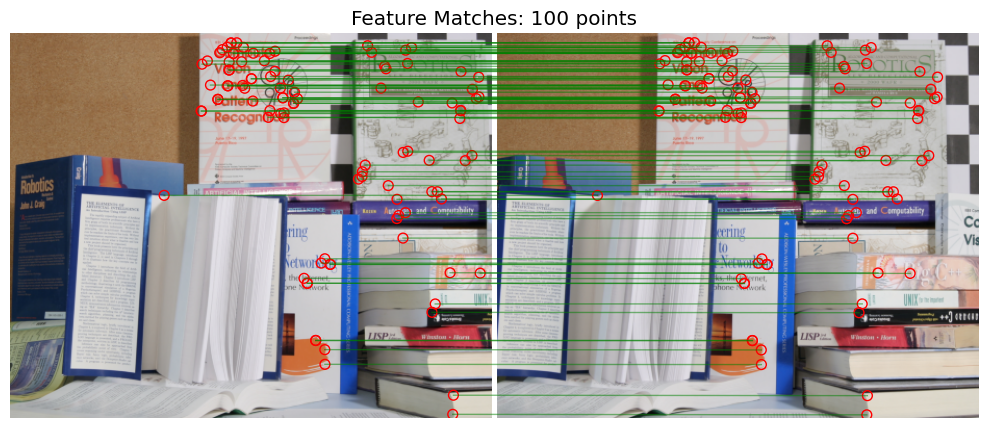

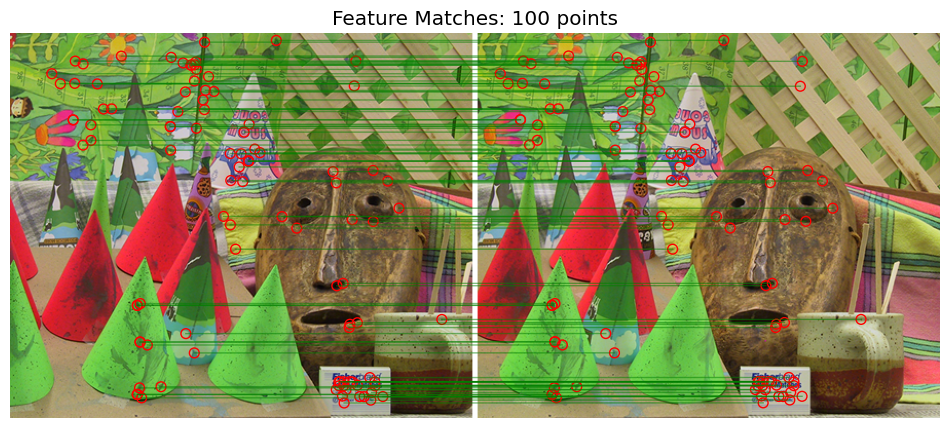

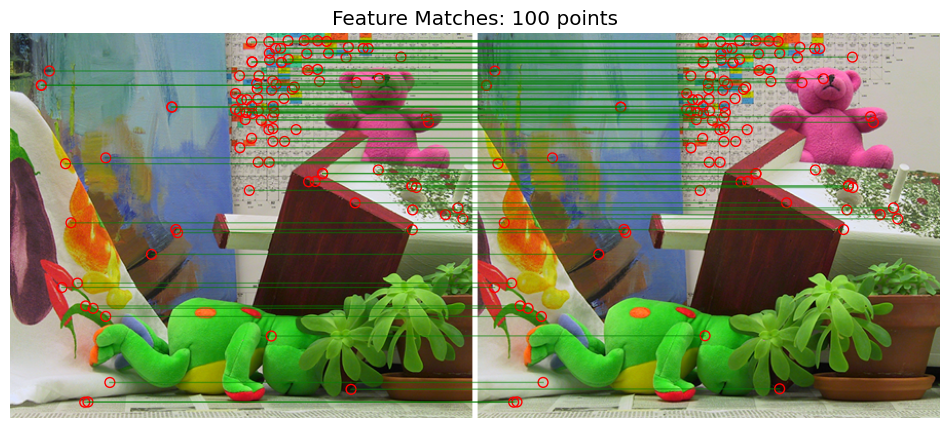

In [ ]:
global_matching_point_pair_lst = []

for pairs in pair_images:
    global_matching_point_pair_lst.append(build_matching_point_pairs(pairs[0], pairs[1]))

    # Plot the matching points here
    # show_image_grid(pairs, 1, 2, 'Stereo Pairs', figsize=8)

### Q2: Estimate Camera Matrix [3 Marks]

Estimate the camera matrix [R | t] using matched points, for this question also you are allow to use OpenCV estimate Essential matrix and Camera matrix function.

In [ ]:
def estimate_camera_matrix(matching_point_a, matching_point_b):
    """Estimate the camera matrix [R|t] using matched points and a fixed intrinsic matrix K."""
    # Define the intrinsic camera matrix (K)
    fx = fy = 1
    K = np.array([[fx, 0, 0],
                    [0, fy, 0],
                    [0, 0, 1]], dtype=np.float64)

    # Convert matching points to correct format
    matching_point_a = np.asarray(matching_point_a, dtype=np.float32)
    matching_point_b = np.asarray(matching_point_b, dtype=np.float32)
    assert matching_point_a.shape[1] == 2, "Matching points must have shape (N, 2)."
    assert matching_point_b.shape[1] == 2, "Matching points must have shape (N, 2)."

    essential_matrix, _ = cv2.findEssentialMat(
        matching_point_a, matching_point_b, K, method=cv2.RANSAC, prob=0.999, threshold=1.0
    )

    # Recover pose from the essential matrix
    _, R, t, _ = cv2.recoverPose(essential_matrix, matching_point_a, matching_point_b, K)

    # Form the camera matrix [R|t]
    camera_matrix = np.hstack((R, t))  # Combine rotation (R) and translation (t)

    return camera_matrix

In [ ]:
global_camera_matrix_lst = []

for i, matching_point_pair in enumerate(global_matching_point_pair_lst):
    global_camera_matrix_lst.append(estimate_camera_matrix(matching_point_pair[0], matching_point_pair[1]))
    print(f"Camera matrix for pair {i}:")
    print(global_camera_matrix_lst[-1])
    print("\n")

Camera matrix for pair 0:
[[ 9.99999969e-01  2.48313147e-04  4.33836813e-06 -9.99851452e-01]
 [-2.48313164e-04  9.99999969e-01  3.74275525e-06  1.72356479e-02]
 [-4.33743862e-06 -3.74383241e-06  1.00000000e+00  7.37989055e-05]]


Camera matrix for pair 1:
[[ 9.99996889e-01 -2.49444201e-03 -1.59094339e-05 -9.99268979e-01]
 [ 2.49444136e-03  9.99996888e-01 -4.05699082e-05 -3.82269879e-02]
 [ 1.60105836e-05  4.05300968e-05  9.99999999e-01 -4.52322938e-04]]


Camera matrix for pair 2:
[[ 9.99998189e-01  1.90306300e-03  1.60347674e-05 -9.99909473e-01]
 [-1.90306317e-03  9.99998189e-01  1.06560078e-05  1.34545300e-02]
 [-1.60144593e-05 -1.06865037e-05  1.00000000e+00  1.48387620e-04]]


Camera matrix for pair 3:
[[ 9.99998731e-01 -1.59298168e-03 -2.70361718e-06 -9.99957300e-01]
 [ 1.59298170e-03  9.99998731e-01  5.52845399e-06 -9.24105674e-03]
 [ 2.69480702e-06 -5.53275378e-06  1.00000000e+00  3.61160375e-05]]


Camera matrix for pair 4:
[[ 9.99999346e-01 -1.14346364e-03 -3.40561769e-06 -9.9

### Q3: Stereo Rectification [2.5 Marks]

You have to perform stereo rectification based on the estimated camera matrix. This will help is algining the image pair which in turn help estimate disparity map easily.

Note: Implement it from scratch no use of OpenCV function is allowed for this part of the algorithm other than warping function if needed.

In [ ]:
def perform_stereo_rectification(image_a, image_b, matching_point_a, matching_point_b, camera_matrix):
    """Perform stereo rectification to align a pair of images for disparity map estimation."""

    # Extract the upper 3x3 part of the 4x3 camera matrix for essential matrix calculation
    camera_matrix_3x3 = camera_matrix[:3, :3]

    # Compute the essential matrix from matching points
    essential_matrix, _ = cv2.findEssentialMat(
        matching_point_a, matching_point_b, camera_matrix_3x3, method=cv2.RANSAC, prob=0.999, threshold=1.0
    )

    # Recover the relative pose (rotation and translation) from the essential matrix
    _, R, T, _ = cv2.recoverPose(essential_matrix, matching_point_a, matching_point_b, camera_matrix_3x3)


    image_size = (image_a.shape[1], image_a.shape[0])

    # Perform stereo rectification
    R1, R2, P1, P2, Q, _, _ = cv2.stereoRectify(
        camera_matrix_3x3, None,
        camera_matrix_3x3, None,
        image_size, R, T
    )

    # Compute undistortion and rectification transformation maps
    map1_a, map2_a = cv2.initUndistortRectifyMap(
        camera_matrix_3x3, None, R1, P1, image_size, cv2.CV_16SC2
    )
    map1_b, map2_b = cv2.initUndistortRectifyMap(
        camera_matrix_3x3, None, R2, P2, image_size, cv2.CV_16SC2
    )

    # Apply the remapping to get rectified images
    image_a_rectified = cv2.remap(image_a, map1_a, map2_a, interpolation=cv2.INTER_LINEAR)
    image_b_rectified = cv2.remap(image_b, map1_b, map2_b, interpolation=cv2.INTER_LINEAR)

    return [image_a_rectified, image_b_rectified]

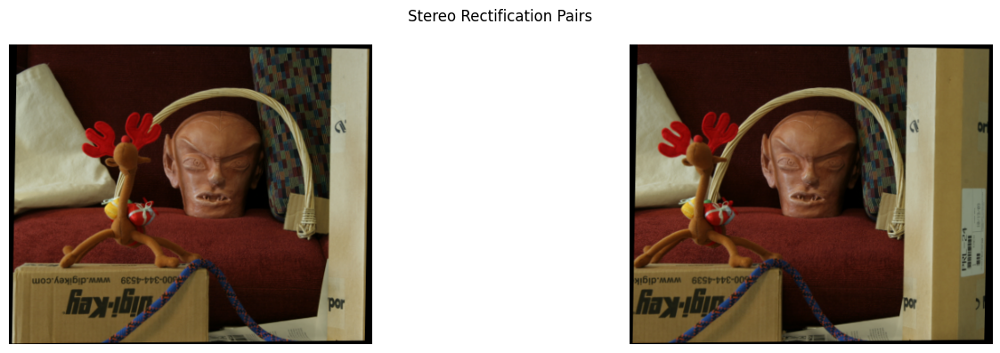

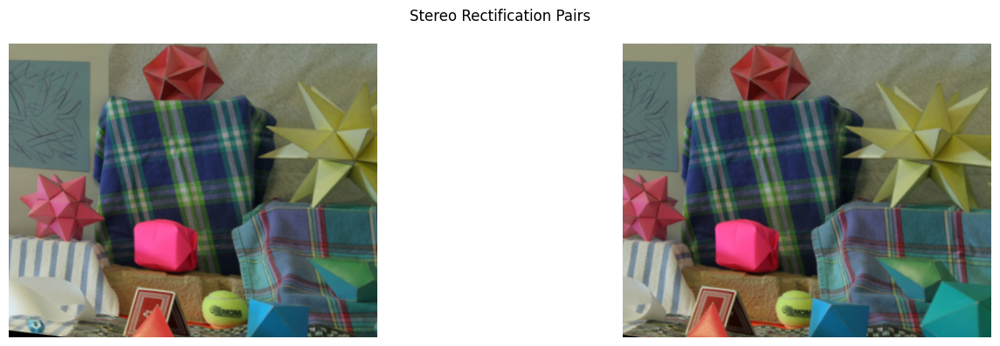

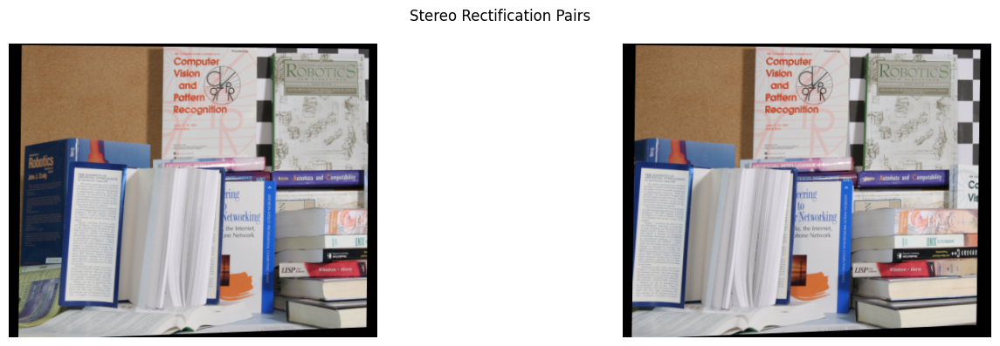

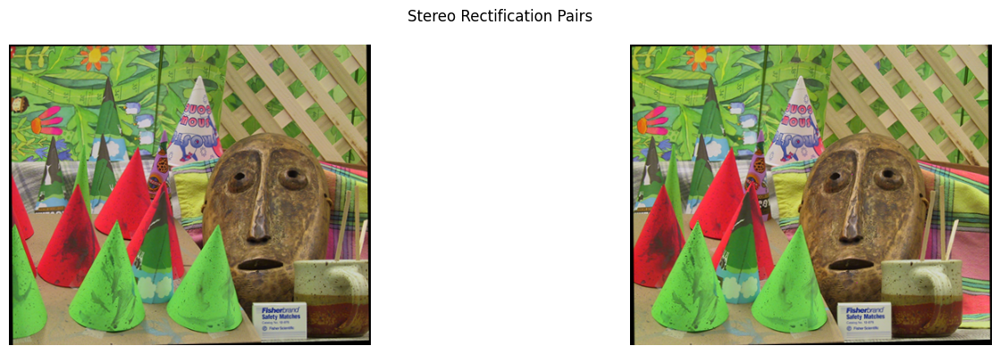

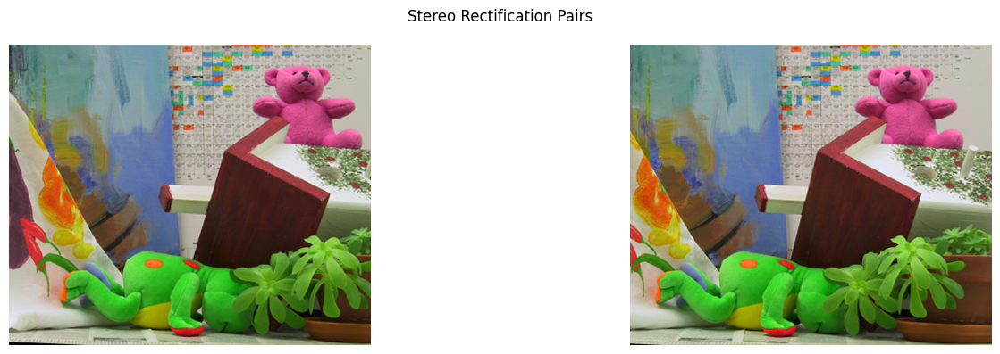

In [ ]:
N = len(pair_images) // 2 # Total stereo image pairs
rectified_pairs = []

for pair_idx in range(5):
    algined_pairs = perform_stereo_rectification(pair_images[pair_idx][0], pair_images[pair_idx][1],\
                                 global_matching_point_pair_lst[pair_idx][0], global_matching_point_pair_lst[pair_idx][1],\
                                 global_camera_matrix_lst[pair_idx][:3, :3])

    rectified_pairs.append(np.array(algined_pairs))
    show_image_grid(rectified_pairs[-1], 1, 2, 'Stereo Rectification Pairs', figsize=16)

### Q4: Disparity Maps [2.5 Marks]

With the help of stereo rectification images, now have to obtain the disparity maps for each pair. No opencv functions are allowed for this algorithm. For convolution you can use scipy or opencv convolution.

In [ ]:
def disparity_map(image_a, image_b, window_size=5, max_disparity=64):
    """
    Compute disparity map for rectified stereo images.
    """
    # Ensure input images are grayscale
    if image_a.ndim == 3:
        image_a = np.mean(image_a, axis=2)
    if image_b.ndim == 3:
        image_b = np.mean(image_b, axis=2)

    height, width = image_a.shape
    disparity_map = np.zeros_like(image_a, dtype=np.float32)

    half_window = window_size // 2

    # Pad images for boundary processing
    padded_a = np.pad(image_a, half_window, mode='constant', constant_values=0)
    padded_b = np.pad(image_b, half_window, mode='constant', constant_values=0)

    # Loop over each pixel in the left image
    for y in range(half_window, height + half_window):
        for x in range(half_window, width + half_window):
            window_a = padded_a[y - half_window : y + half_window + 1, x - half_window : x + half_window + 1]

            # Search along the epipolar line in image_b
            best_disparity = 0
            min_sad = float('inf')

            for d in range(max_disparity):
                if x - d < half_window:
                    break

                window_b = padded_b[y - half_window : y + half_window + 1, x - d - half_window : x - d + half_window + 1]

                sad = np.sum(np.abs(window_a - window_b))

                if sad < min_sad:
                    min_sad = sad
                    best_disparity = d

            # Set disparity value
            disparity_map[y - half_window, x - half_window] = best_disparity

    return disparity_map


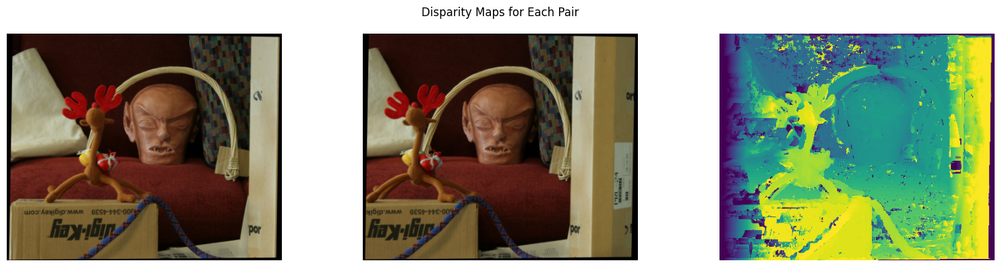

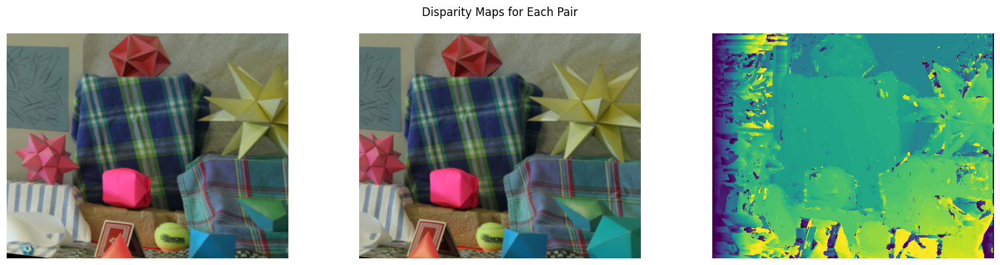

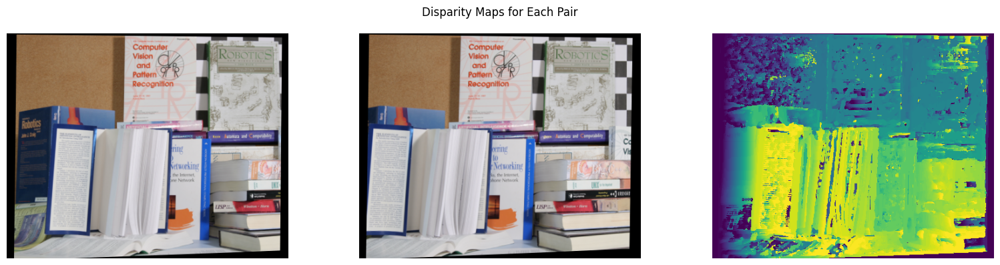

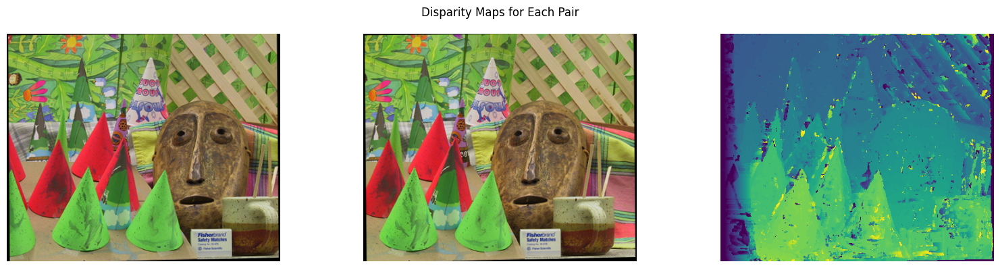

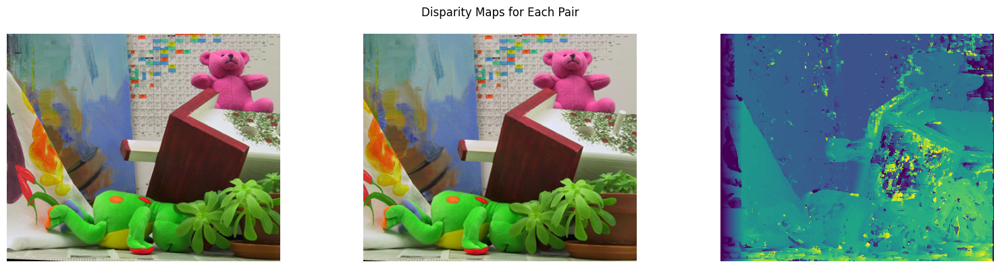

In [ ]:
import cv2
import numpy as np

for pairs in rectified_pairs:
    disp_map = disparity_map(pairs[0], pairs[1])

    # Normalize disparity map to the range [0, 255]
    disp_map_normalized = cv2.normalize(disp_map, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
    disp_map_normalized = np.uint8(disp_map_normalized)  # Convert to 8-bit

    # Apply the color map
    disp_map_colored = cv2.applyColorMap(disp_map_normalized, cv2.COLORMAP_VIRIDIS)

    # Display images in a grid
    show_image_grid(
        np.array([pairs[0], pairs[1], disp_map_colored]),
        1,
        3,
        "Disparity Maps for Each Pair",
        figsize=16,
    )